# Load packages

In [1]:
import sklearn.metrics as sk
import scanpy as sc
import pandas as pd
import numpy as np

In [2]:
hotspot=pd.read_csv('../../figures/tables/hotspot_msbrain_nuclei_rep1.csv')
giotto=pd.read_csv('../../figures/tables/giotto_kmtest_svg_msbrain1.csv')
moranI=pd.read_csv('../../figures/tables/moranI_nuclei_rep1.csv')
geary_c=pd.read_csv('../../figures/tables/gearyC_nuclei_rep1.csv')
somde=pd.read_csv('../../figures/tables/somde_svg_msbrain_output_nuclei_rep1.csv')

In [3]:
spatialDE=pd.read_csv('../../figures/tables/spatialDE_scores_nuclei_rep1.csv')

In [4]:

giotto_merge=pd.DataFrame(list(giotto['p.value']),index=giotto.genes,columns=['pval_giotto'])
hotspot_merge=pd.DataFrame(list(hotspot['Pval']),index=hotspot.Gene,columns=['pval_hotspot'])
morani_merge=moranI.loc[:,['pval_norm','I']]
morani_merge.index=moranI['Unnamed: 0']
morani_merge.columns=['pval_I','I']
gearyc_merge=geary_c.loc[:,['pval_norm','C']]
gearyc_merge.index=geary_c['Unnamed: 0']
gearyc_merge.columns=['pval_C','C']
somde_merge=pd.DataFrame(list(somde['pval']),index=somde.g,columns=['pval_somde'])



In [5]:
spatialde_merge=pd.DataFrame(list(spatialDE['qval']),index=spatialDE['index'],columns=['pval_spatialde'])

In [6]:
spatialde_merge['rank_spatialde']=list(np.argsort(spatialde_merge.iloc[:,0]))
giotto_merge['rank_giotto']=list(np.argsort(giotto_merge.iloc[:,0]))
hotspot_merge['rank_hotspot']=list(np.argsort(hotspot_merge.iloc[:,0]))
morani_merge['rank_moranI']=list(np.argsort(morani_merge.iloc[:,0]))
gearyc_merge['rank_gearyC']=list(np.argsort(gearyc_merge.iloc[:,0]))
somde_merge['rank_somde']=list(np.argsort(somde_merge.iloc[:,0]))

In [7]:
m1_merge=pd.merge(spatialde_merge,giotto_merge,left_index=True,right_index=True)
m2_merge=pd.merge(m1_merge,hotspot_merge,left_index=True,right_index=True)
m3_merge=pd.merge(m2_merge,morani_merge,left_index=True,right_index=True)
m4_merge=pd.merge(m3_merge,gearyc_merge,left_index=True,right_index=True)
m5_merge=pd.merge(m4_merge,somde_merge,left_index=True,right_index=True)

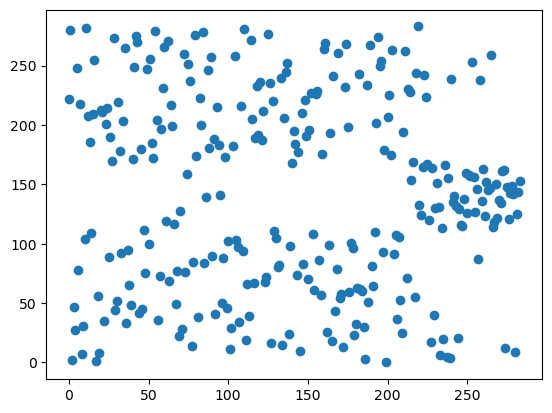

In [8]:
import matplotlib.pyplot as plt
plt.scatter(m5_merge['rank_somde'],m5_merge['rank_spatialde'])
#plt.yscale("log")
#plt.xscale("log")

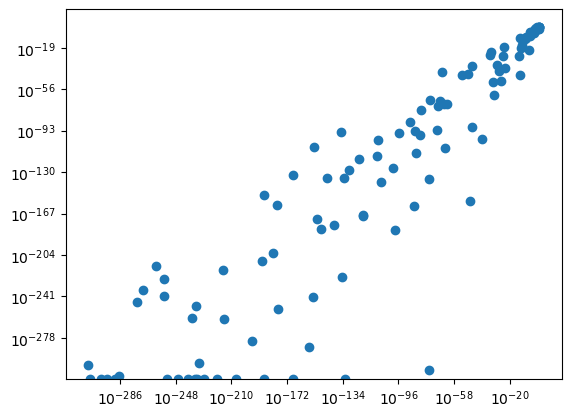

In [9]:
import matplotlib.pyplot as plt
plt.scatter(m2_merge['pval_hotspot'],m2_merge['pval_giotto'])
plt.yscale("log")
plt.xscale("log")

In [10]:
from scipy.stats import spearmanr

In [11]:
selected=['rank_spatialde', 'rank_giotto','rank_hotspot','rank_moranI','rank_gearyC','rank_somde']

In [12]:
output_corr=pd.DataFrame(index=selected,columns=selected)

In [13]:
for c in output_corr.index:
    for r in output_corr.columns:
        ous, p = spearmanr(m5_merge.loc[:,c],m5_merge.loc[:,r])
        output_corr.loc[c,r]=ous

<Figure size 400x400 with 0 Axes>

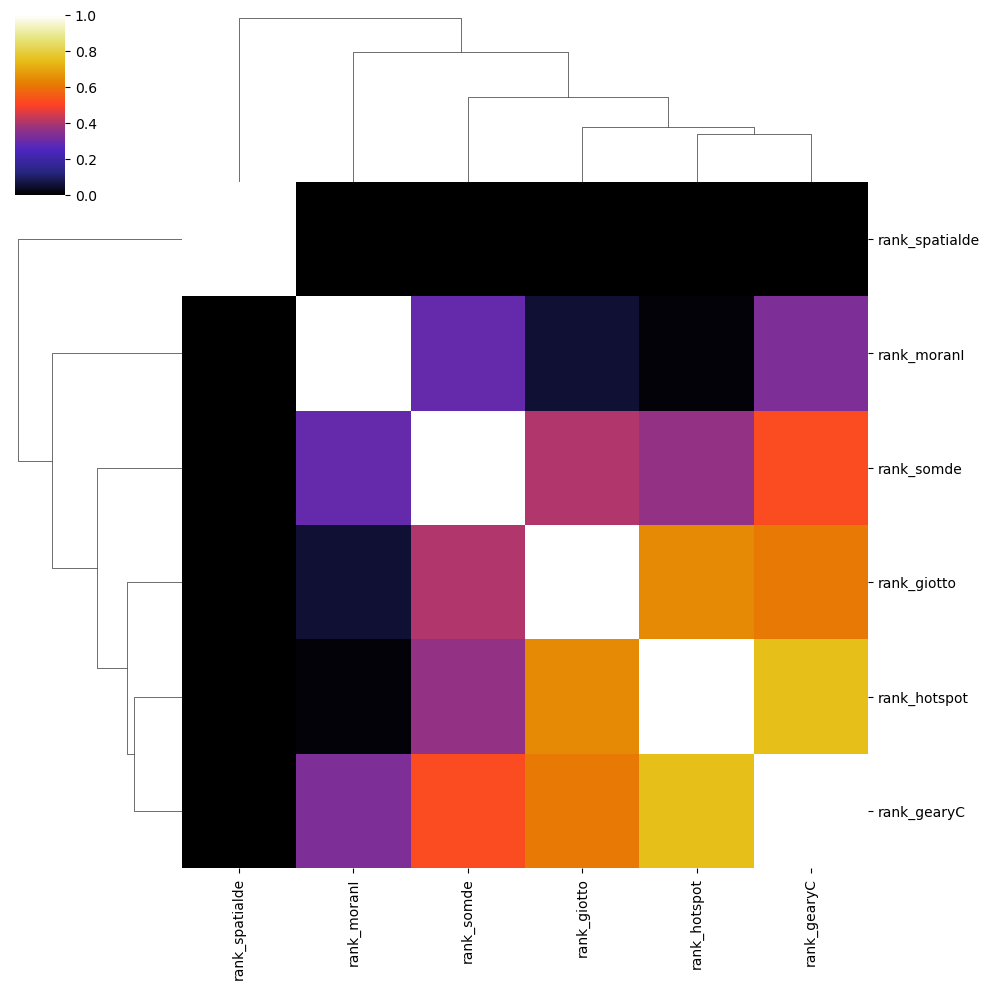

In [14]:
import seaborn as sns
plt.figure(figsize=(4,4))
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sns.clustermap(output_corr.astype(float),vmax=1,vmin=0,cmap='CMRmap')

In [15]:
m5_merge

,pval_spatialde,rank_spatialde,pval_giotto,rank_giotto,pval_hotspot,rank_hotspot,pval_I,I,rank_moranI,pval_C,C,rank_gearyC,pval_somde,rank_somde
Cd44,1.097350e-11,141,1.333802e-108,225,2.854127e-154,206,0.000000e+00,0.064175,99,7.359133e-165,0.940782,222,0.000000e+00,95
Chat,0.000000e+00,142,2.765636e-01,279,6.114937e-01,282,5.791058e-02,-0.003445,281,2.337338e-05,1.008819,280,4.253187e-02,279
Pf4,0.000000e+00,143,1.096199e-05,265,2.524334e-06,268,3.680395e-08,0.011619,265,3.453950e-05,0.991380,283,2.878302e-02,277
Slc6a3,0.000000e+00,144,7.080760e-03,271,3.165391e-01,279,2.359594e-01,-0.001597,280,3.060954e-08,1.011730,281,3.249297e-01,282
Trh,0.000000e+00,145,2.283865e-06,269,1.265204e-04,269,1.585958e-04,0.007761,270,2.019445e-01,0.998192,278,7.310815e-04,263
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Tacr1,4.576635e-03,283,6.941745e-27,254,3.034498e-25,254,0.000000e+00,0.038784,80,1.245625e-92,0.955854,239,2.664535e-15,219
Th,8.735622e-02,9,1.949332e-01,281,5.089859e-01,281,1.368923e-01,0.002332,277,8.513730e-03,0.994831,275,6.349502e-02,280
Tmem132d,0.000000e+00,280,3.106096e-315,93,0.000000e+00,146,0.000000e+00,0.256243,145,0.000000e+00,0.743649,118,0.000000e+00,1
Tmem255a,9.767358e-17,11,3.886331e-178,209,1.585013e-140,210,0.000000e+00,0.066019,111,1.549430e-203,0.934110,211,0.000000e+00,101


In [16]:
output_corr.index

Index(['rank_spatialde', 'rank_giotto', 'rank_hotspot', 'rank_moranI',
       'rank_gearyC', 'rank_somde'],
      dtype='object')

In [17]:
common_top100_genes=(m5_merge.loc[:,output_corr.index]<100)*1

In [18]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import sklearn.metrics as sm 

In [19]:
jaccard_top100=pd.DataFrame(index=common_top100_genes.columns,columns=common_top100_genes.columns)
for ind in jaccard_top100.columns:
    for col in jaccard_top100.columns:
        jaccard_top100.loc[ind,col]=sm.jaccard_score(common_top100_genes.loc[:,ind],common_top100_genes.loc[:,col],average='binary')

In [25]:
jaccard_top100[jaccard_top100==1]=0

In [28]:
np.mean(np.sum(jaccard_top100)/4)

0.3984723869671039

<Figure size 400x400 with 0 Axes>

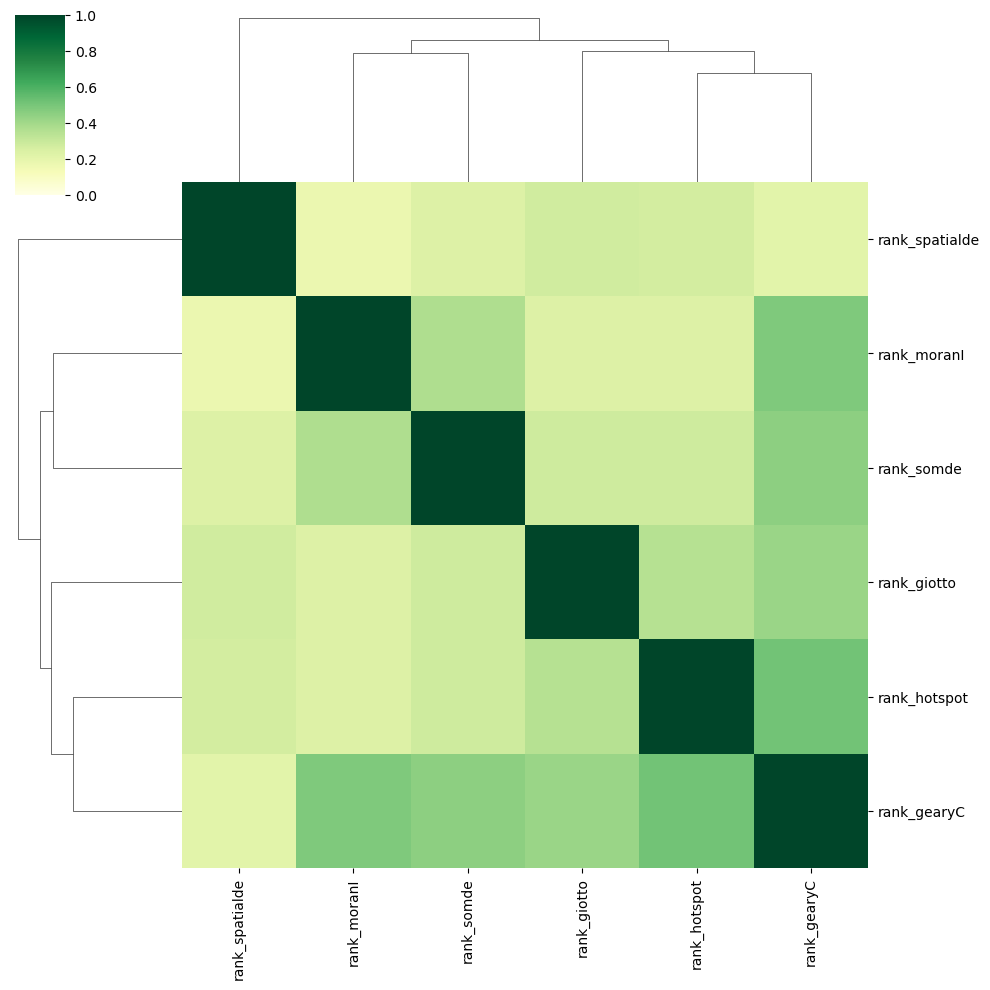

In [21]:
import seaborn as sns
plt.figure(figsize=(4,4))
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sns.clustermap(jaccard_top100.astype(float),vmax=1,vmin=0,cmap='YlGn')
plt.savefig('../../figures/7.spatial_architecture/jaccard_100genes_rep1_heatmap.pdf')

In [23]:
m5_merge['std_methods']=list(np.std(m5_merge.loc[:,output_corr.index],axis=1))

# Select pvals

In [24]:
selected=['pval_spatialde', 'pval_giotto','pval_hotspot','pval_I','pval_C','pval_somde']

In [25]:
m5_merge_pvals=m5_merge.loc[:,selected]

In [26]:
np.sum(m5_merge_pvals<0.005,axis=0)

pval_spatialde    272
pval_giotto       272
pval_hotspot      272
pval_I            272
pval_C            279
pval_somde        271
dtype: int64

In [52]:
m5_merge_pvals[m5_merge_pvals>0.05]='0.05'
m5_merge_pvals[m5_merge_pvals>0.005]='0.005'
m5_merge_pvals[m5_merge_pvals>0.0005]='0.0005'

TypeError: '>' not supported between instances of 'str' and 'float'

In [27]:
pvls=(m5_merge_pvals<0.005)*1

In [53]:
counting=pd.DataFrame(index=[1,0],columns=pvls.columns)

In [54]:
for ind in counting.index:
    for col in counting.columns:
        counting.loc[ind,col]=np.sum(pvls.loc[:,col]==ind)

In [145]:
counting.div(counting.sum(axis=0),axis=1).sum(axis=1)/6

1    0.961268
0    0.038732
dtype: float64

<Figure size 200x700 with 0 Axes>

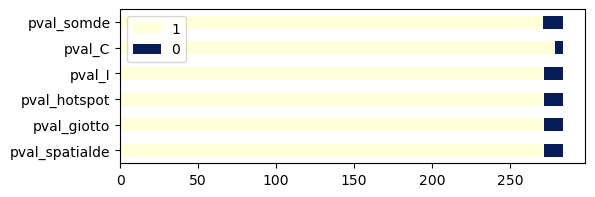

In [70]:
plt.figure(figsize=(2,7))
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
counting.transpose().plot.barh(stacked=True,figsize=(6,2),cmap='YlGnBu')
plt.savefig('../../figures/7.spatial_architecture/svg_by_method_rep1_barplot.pdf')

In [28]:
pvlsres=pd.DataFrame(index=pvls.columns,columns=pvls.columns)
for ind in pvls.columns:
    for col in pvls.columns:
        pvlsres.loc[ind,col]=sm.jaccard_score(pvls.loc[:,ind],pvls.loc[:,col],average='binary')

<Figure size 400x400 with 0 Axes>

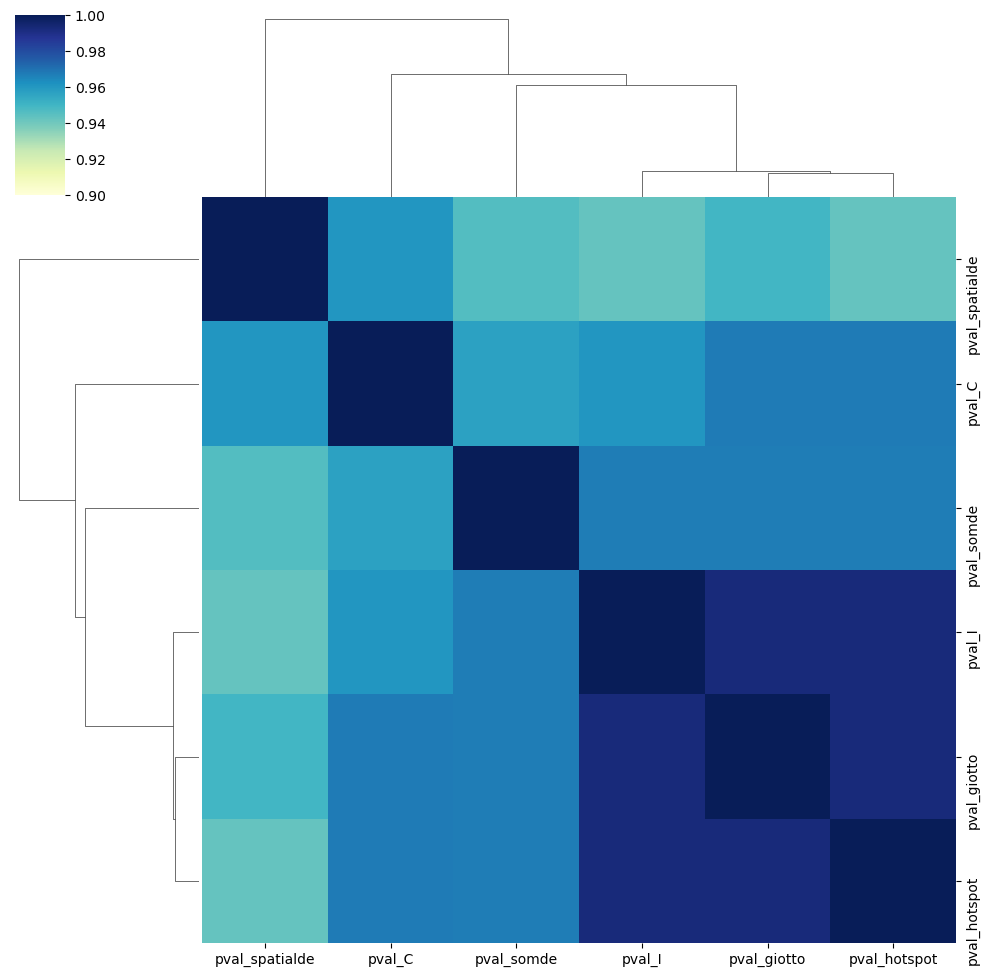

In [71]:
import seaborn as sns
plt.figure(figsize=(4,4))
import matplotlib
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
sns.clustermap(pvlsres.astype(float),vmax=1,vmin=0.90,cmap='YlGnBu')
plt.savefig('../../figures/7.spatial_architecture/jaccard_rep1_heatmap.pdf')

In [80]:
ll=list(np.sum(pvls,axis=1))

In [81]:
rs=[]
for e in [0,1,2,3,4,5,6]:
    rs.append(ll.count(e))

In [85]:
common=pd.DataFrame(ll,index=pvls.index)

In [131]:
common[common.loc[:,0]==3]

,0
Chodl,3
Cd86,3
Il1a,3


In [125]:
common[common.loc[:,0]==6].index

Index(['Cd44', 'Zfp366', 'Acsbg1', 'Acvrl1', 'Adgrl4', 'Aldh1l1', 'Carmn',
       'Cbln1', 'Ccn2', 'Cd93',
       ...
       'Prph', 'Rbp4', 'Satb2', 'Sema5b', 'Sla', 'Slc18a2', 'Spp1', 'Tacr1',
       'Tmem132d', 'Tmem255a'],
      dtype='object', length=260)

# We now read adata to show some genes with and without SV expression

In [88]:
adata=sc.read('../../data/processed_adata/adata_msbrain_3rep_withclusters_only_nuclei_deep_annotation.h5ad')

In [91]:
adata1=adata[adata.obs['replicate']=='1']

In [95]:
expr1=pd.DataFrame(adata1.X.todense(),columns=adata.var.index)

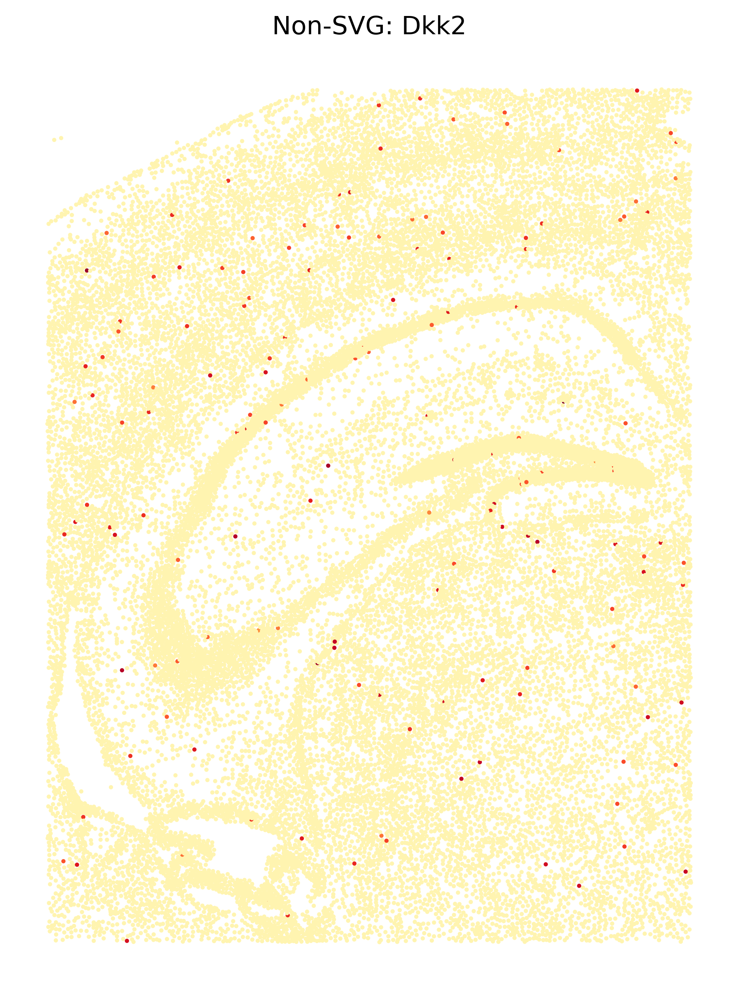

In [165]:
plt.figure(figsize=(6,8),dpi=400)
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.scatter(adata1.obs['X'],adata1.obs['Y'],s=1,c=expr1.loc[:,'Dkk2'],cmap='YlOrRd',vmin=-0.6)
plt.title('Non-SVG: Dkk2')
plt.axis('off')
plt.savefig('../../figures/7.spatial_architecture/Dkk2_no_SVG.tif')

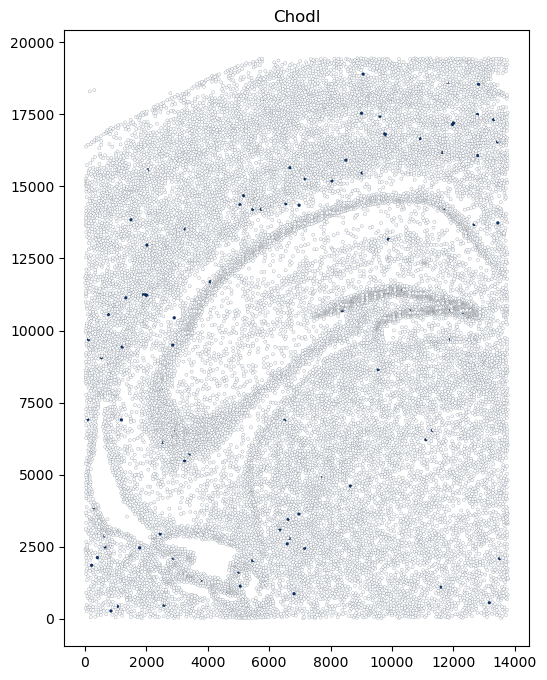

In [142]:
plt.figure(figsize=(6,8))
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.scatter(adata1.obs['X'],adata1.obs['Y'],s=5,c=expr1.loc[:,'Chodl'],cmap='Blues',edgecolors='black',linewidth=0.09,vmax=0.1)
plt.title('Chodl')
plt.savefig('../../figures/7.spatial_architecture/Chodl_no_SVG.pdf')

In [156]:
expr1

index,2010300C02Rik,Acsbg1,Acta2,Acvrl1,Adamts2,Adamtsl1,Adgrl4,Aldh1a2,Aldh1l1,Angpt1,...,Trpc4,Tubb2a,Unc13c,Vat1l,Vip,Vwc2l,Wfs1,Zfp366,Zfp536,Zfpm2
0,0.000000,0.0,0.0,0.0,0.000000,5.672825,0.0,0.0,0.0,0.0,...,4.98311,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,6.364252,0.000000
1,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.00000,5.576547,6.267799,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000
2,0.000000,0.0,0.0,0.0,5.525453,5.525453,0.0,0.0,0.0,0.0,...,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,6.216606,0.000000
3,0.000000,0.0,0.0,0.0,0.000000,4.355722,0.0,0.0,0.0,0.0,...,0.00000,4.355722,0.000000,4.355722,0.0,0.000000,0.000000,0.0,6.136730,0.000000
4,5.779449,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.00000,0.000000,5.089387,5.089387,0.0,0.000000,5.089387,0.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25690,5.594180,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.00000,5.190573,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000
25691,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000
25692,4.175964,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.00000,4.861402,0.000000,4.175964,0.0,4.175964,0.000000,0.0,0.000000,0.000000
25693,0.000000,0.0,0.0,0.0,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.00000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.0,0.000000,0.000000


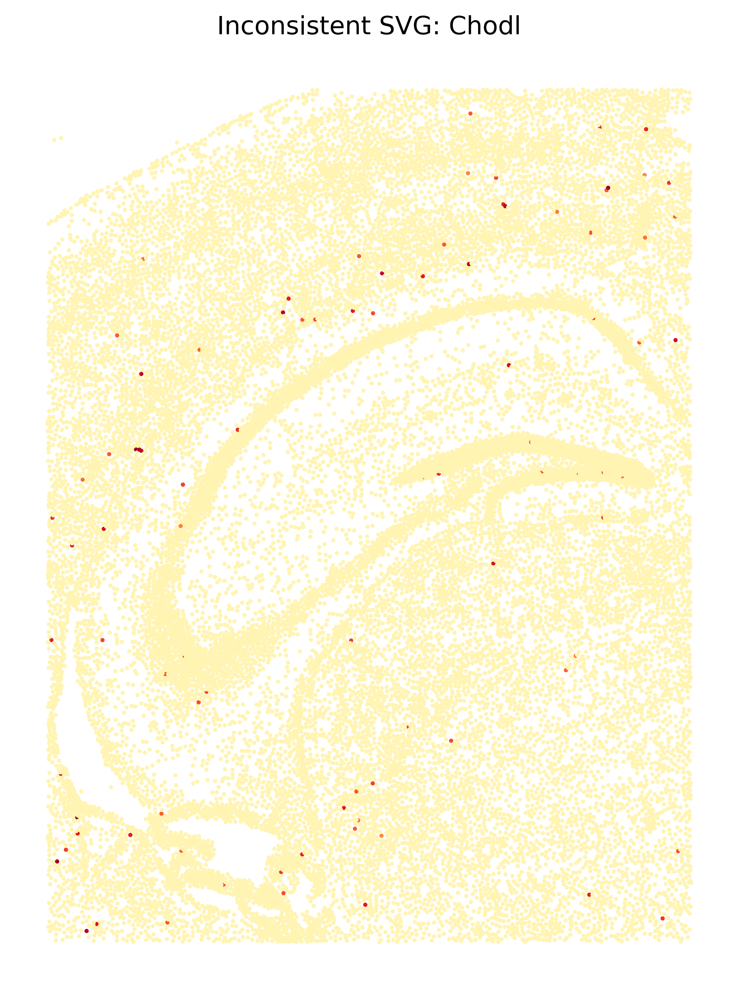

In [166]:
plt.figure(figsize=(6,8),dpi=400)
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.scatter(adata1.obs['X'],adata1.obs['Y'],s=1,c=expr1.loc[:,'Chodl'],cmap='YlOrRd',vmin=-0.6)
plt.title('Inconsistent SVG: Chodl')
plt.axis('off')
plt.savefig('../../figures/7.spatial_architecture/Chodl_inter_SVG.tif')

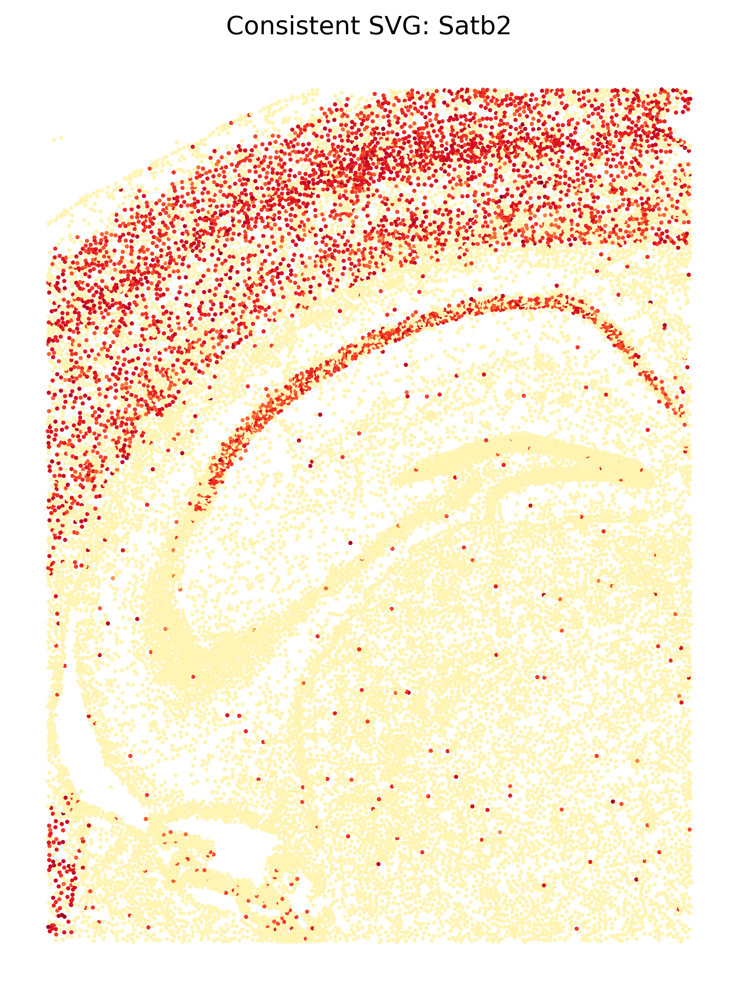

In [168]:
plt.figure(figsize=(6,8),dpi=400)
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.scatter(adata1.obs['X'],adata1.obs['Y'],s=1,c=expr1.loc[:,'Satb2'],cmap='YlOrRd',vmin=-0.6)
plt.title('Consistent SVG: Satb2')
plt.axis('off')
plt.savefig('../../figures/7.spatial_architecture/Satb2_yes_SVG.tif')

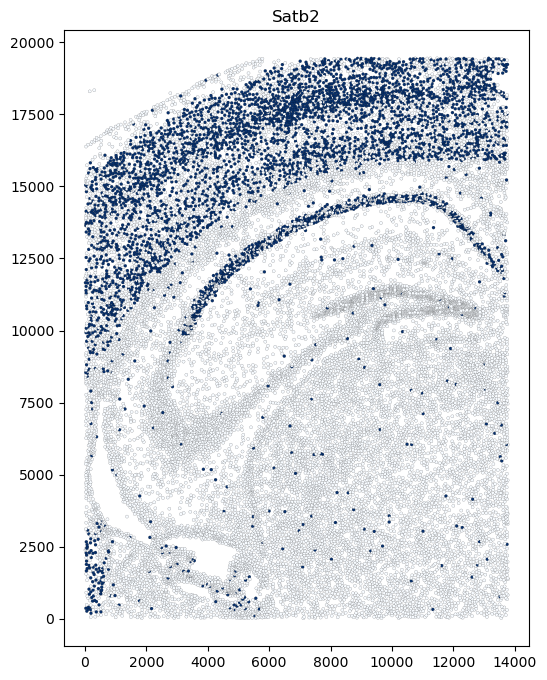

In [143]:
plt.figure(figsize=(6,8))
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
plt.scatter(adata1.obs['X'],adata1.obs['Y'],s=5,c=expr1.loc[:,'Satb2'],cmap='Blues'#),edgecolors='black',linewidth=0.09,vmax=2)
